In [47]:
import pandas as pd
import matplotlib.pyplot as plt
from IPython.display import Image, display

In [50]:
# 1. Load Training Metrics
csv_path = "runs/train/yolov8_dota_run22/results.csv"
df = pd.read_csv(csv_path)

print("📊 Training Metrics of Epochs:")
display(df.tail(50))

📊 Training Metrics of Epochs:


,epoch,time,train/box_loss,train/cls_loss,train/dfl_loss,metrics/precision(B),metrics/recall(B),metrics/mAP50(B),metrics/mAP50-95(B),val/box_loss,val/cls_loss,val/dfl_loss,lr/pg0,lr/pg1,lr/pg2
0,1,100.227,2.09291,3.73423,1.26562,0.57218,0.13837,0.11337,0.06884,1.92087,2.43300,1.12878,0.000175,0.000175,0.000175
1,2,193.592,1.95635,2.39995,1.14104,0.58572,0.18887,0.18690,0.10553,1.84985,2.03233,1.09718,0.000343,0.000343,0.000343
2,3,287.372,1.87730,2.09489,1.11139,0.63622,0.22673,0.22565,0.12378,1.79684,1.86100,1.08595,0.000505,0.000505,0.000505
3,4,380.894,1.79026,1.92469,1.09768,0.57211,0.23428,0.23697,0.12866,1.78675,1.76141,1.07965,0.000495,0.000495,0.000495
4,5,472.228,1.77480,1.81457,1.08520,0.60634,0.24674,0.25919,0.14376,1.73112,1.61482,1.04785,0.000484,0.000484,0.000484
5,6,564.610,1.75960,1.71060,1.08630,0.63017,0.30215,0.30430,0.16836,1.67980,1.51263,1.05006,0.000474,0.000474,0.000474
6,7,654.563,1.70247,1.63909,1.06983,0.64234,0.30512,0.31576,0.17485,1.68770,1.49475,1.04548,0.000464,0.000464,0.000464
7,8,744.816,1.67710,1.55978,1.06046,0.62029,0.31786,0.31454,0.18019,1.64776,1.44707,1.03191,0.000453,0.000453,0.000453
8,9,835.511,1.63899,1.48400,1.04263,0.69241,0.34017,0.35432,0.19874,1.63256,1.44300,1.02484,0.000443,0.000443,0.000443
9,10,927.470,1.60371,1.47383,1.04717,0.64114,0.33008,0.34858,0.18994,1.63519,1.39790,1.02545,0.000432,0.000432,0.000432


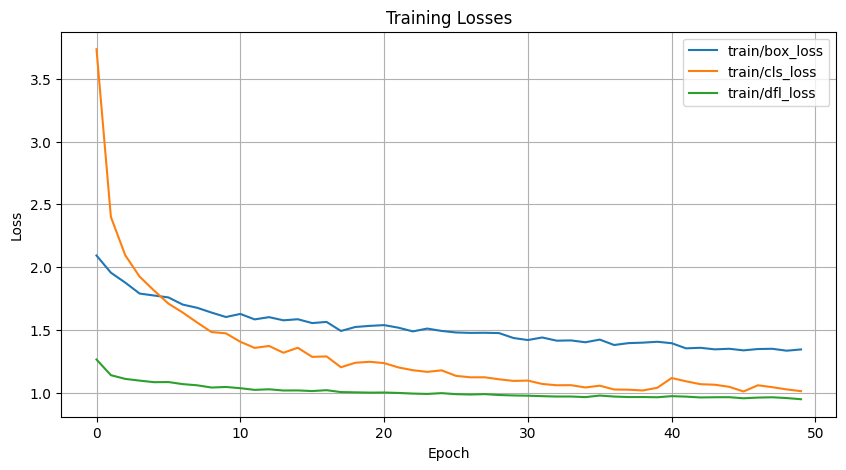

In [51]:
# 🔹 3. Plot Loss Curves
df[['train/box_loss', 'train/cls_loss', 'train/dfl_loss']].plot(title='Training Losses', figsize=(10, 5))
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.grid()
plt.show()

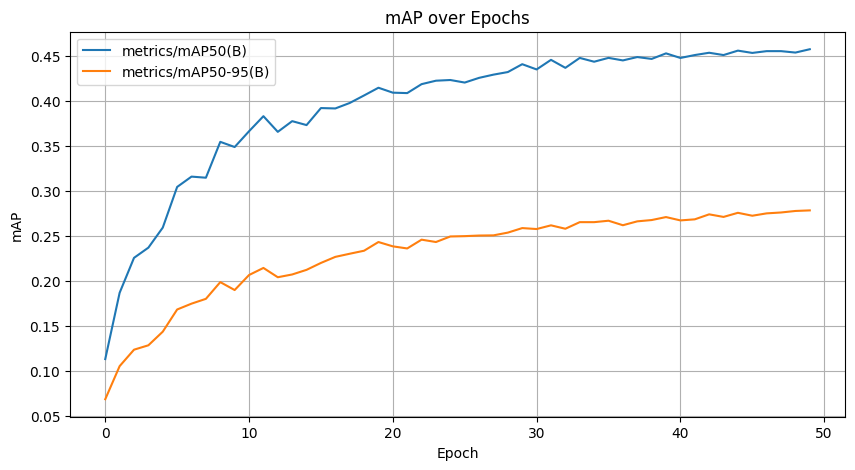

In [52]:
# 🔹 4. Plot mAP over Epochs
df[['metrics/mAP50(B)', 'metrics/mAP50-95(B)']].plot(title='mAP over Epochs', figsize=(10, 5))
plt.xlabel('Epoch')
plt.ylabel('mAP')
plt.grid()
plt.show()

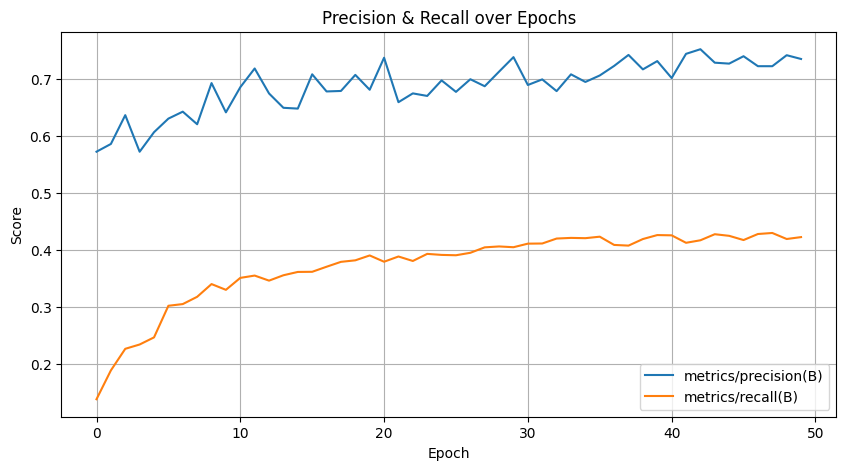

In [53]:
# 🔹 5. Plot Precision and Recall
df[['metrics/precision(B)', 'metrics/recall(B)']].plot(title='Precision & Recall over Epochs', figsize=(10, 5))
plt.xlabel('Epoch')
plt.ylabel('Score')
plt.grid()
plt.show()

🖼️ Evaluation Visuals:


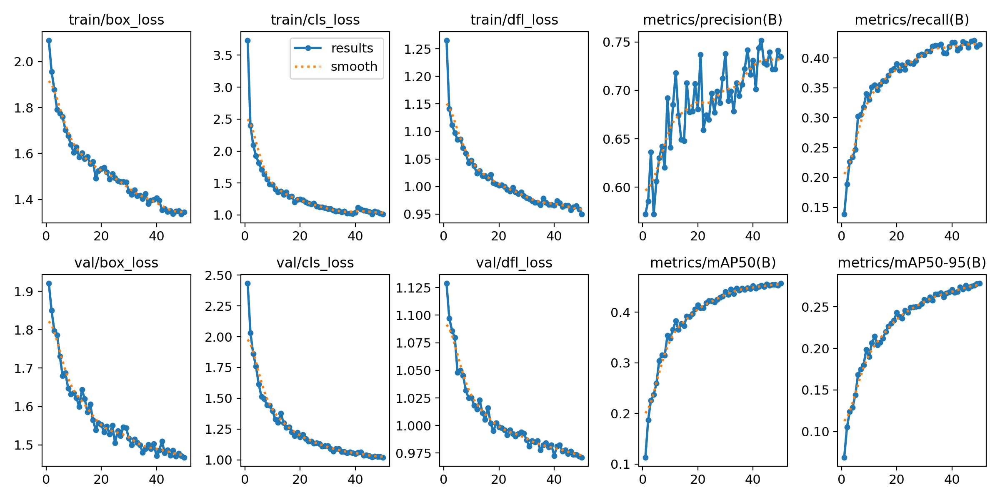

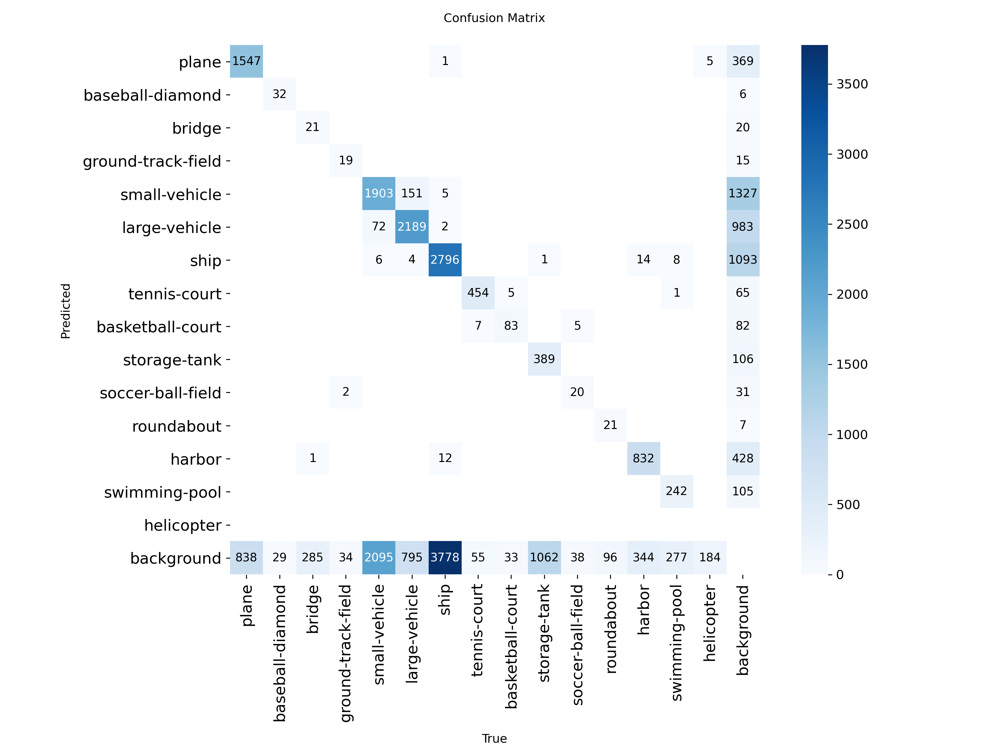

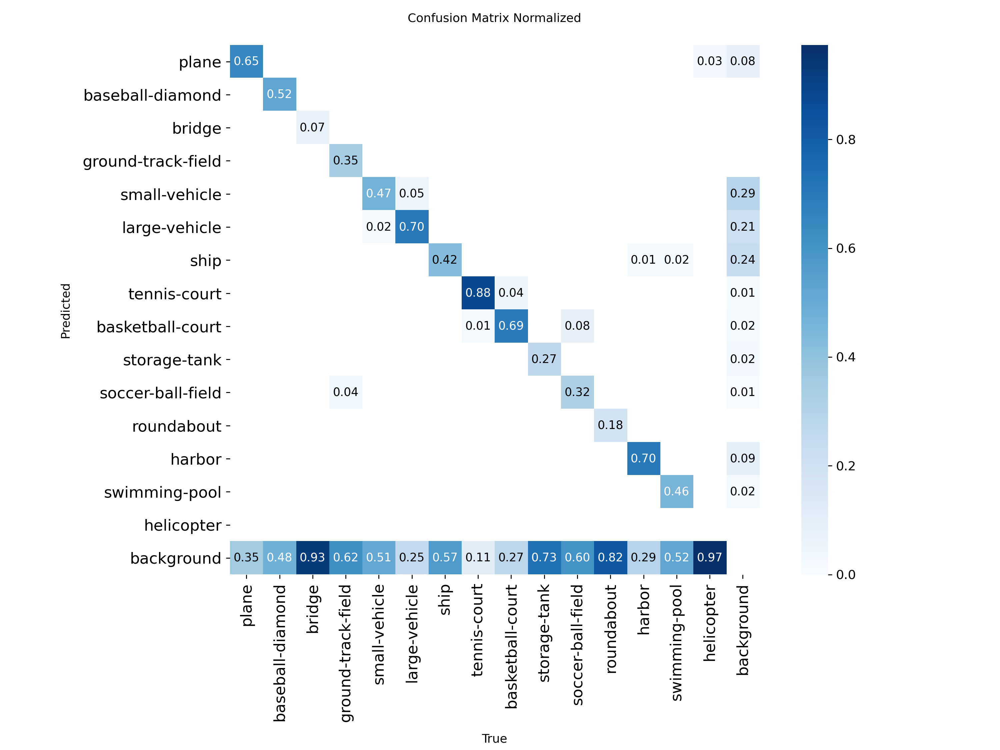

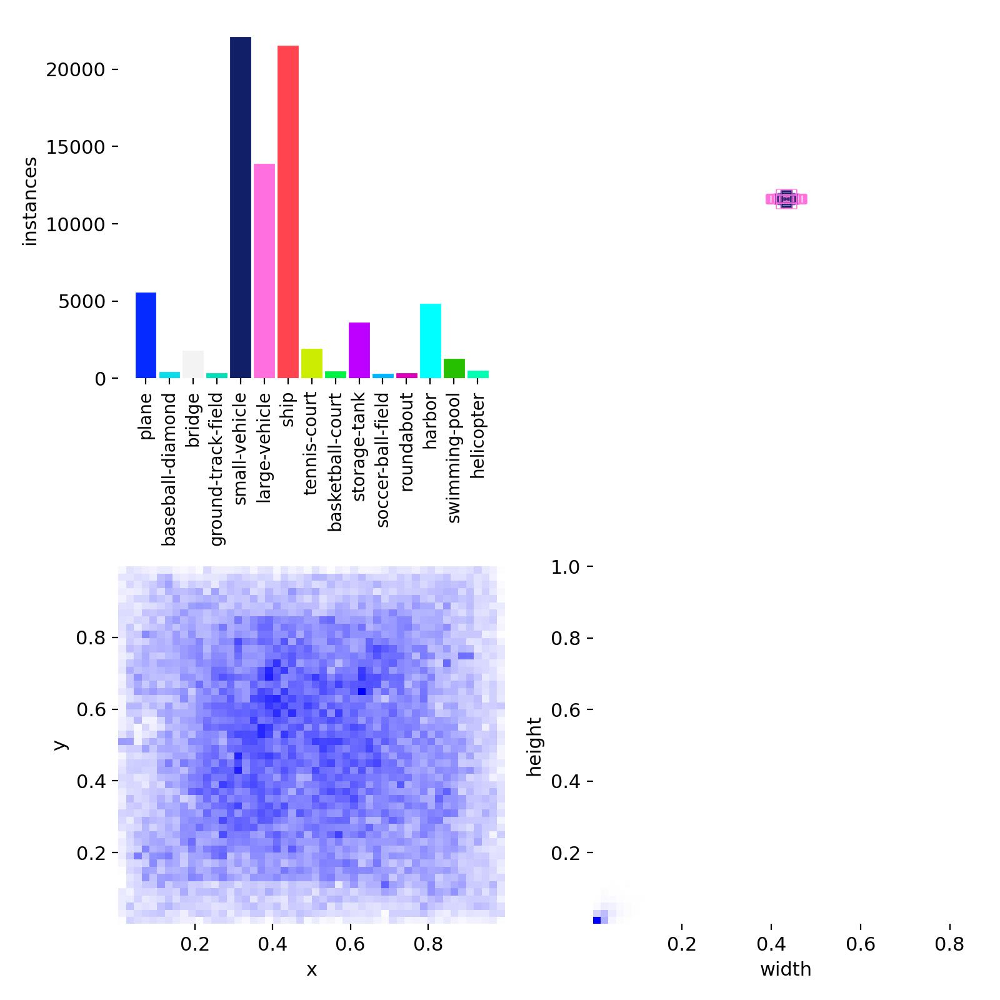

In [54]:
# 🔹 6. Show evaluation plots (auto-generated by Ultralytics)
print("🖼️ Evaluation Visuals:")
display(Image(filename='runs/train/yolov8_dota_run22/results.png'))
display(Image(filename='runs/train/yolov8_dota_run22/confusion_matrix.png'))
display(Image(filename='runs/train/yolov8_dota_run22/confusion_matrix_normalized.png'))
display(Image(filename='runs/train/yolov8_dota_run22/labels.jpg'))

In [55]:
# 7. Model Artifacts
print("\n✅ Training Complete!")
print("Best model saved at:", model.ckpt_path if hasattr(model, 'ckpt_path') else "runs/train/yolov8_dota_run/weights/best.pt")


✅ Training Complete!
Best model saved at: yolov8n.pt


In [58]:
from ultralytics import YOLO

model = YOLO("runs/train/yolov8_dota_run22/weights/best.pt")
print("✅ Model loaded")

✅ Model loaded


In [59]:
import os
from glob import glob
import random

val_img_dir = "yolo_dataset/images/val"
val_images = glob(os.path.join(val_img_dir, "*.png"))
sample_images = random.sample(val_images, 10)

results = model.predict(source=sample_images, save=False, conf=0.25)


0: 896x896 17 ships, 103 storage-tanks, 4.1ms
1: 896x896 60 small-vehicles, 14 tennis-courts, 4.1ms
2: 896x896 15 ships, 3 harbors, 4.1ms
3: 896x896 4 small-vehicles, 4 tennis-courts, 4.1ms
4: 896x896 2 bridges, 4.1ms
5: 896x896 4 small-vehicles, 3 ships, 50 tennis-courts, 9 soccer-ball-fields, 2 harbors, 1 swimming-pool, 4.1ms
6: 896x896 1 ship, 4.1ms
7: 896x896 1 ship, 6 harbors, 4.1ms
8: 896x896 59 small-vehicles, 59 large-vehicles, 2 ships, 4.1ms
9: 896x896 3 small-vehicles, 8 tennis-courts, 1 swimming-pool, 4.1ms
Speed: 5.4ms preprocess, 4.1ms inference, 1.0ms postprocess per image at shape (1, 3, 896, 896)


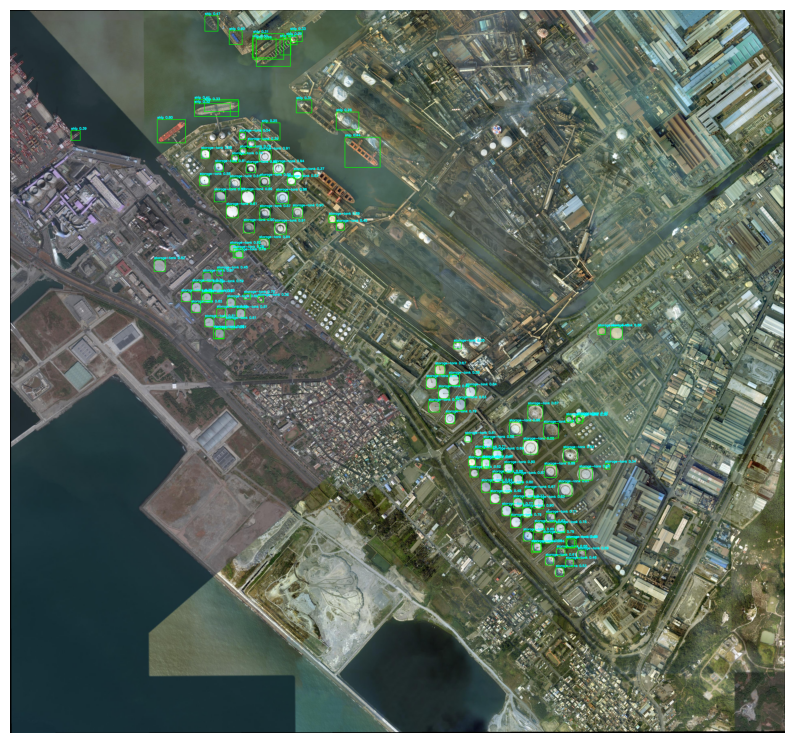

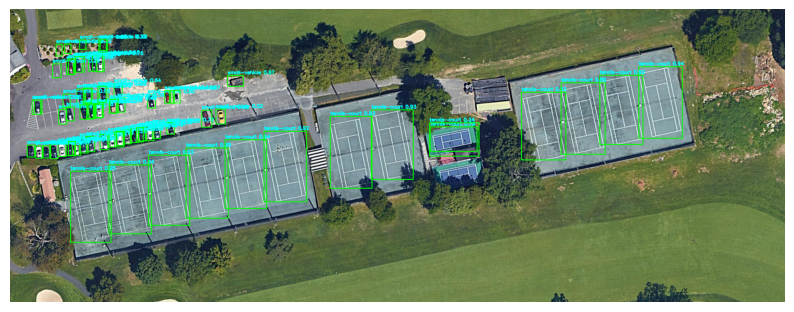

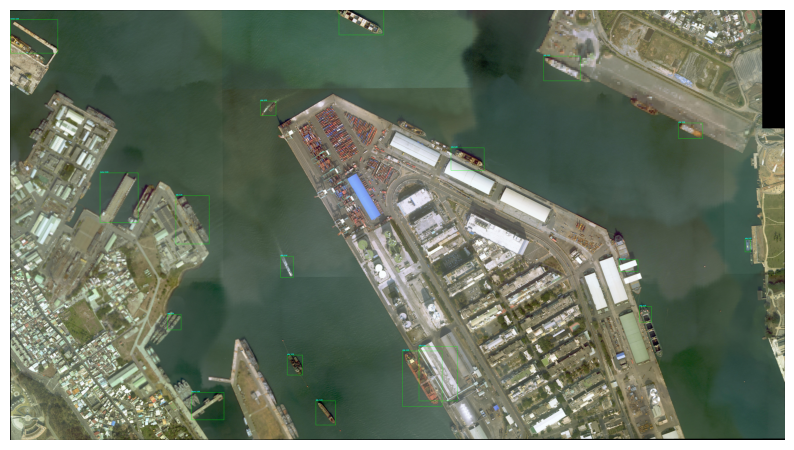

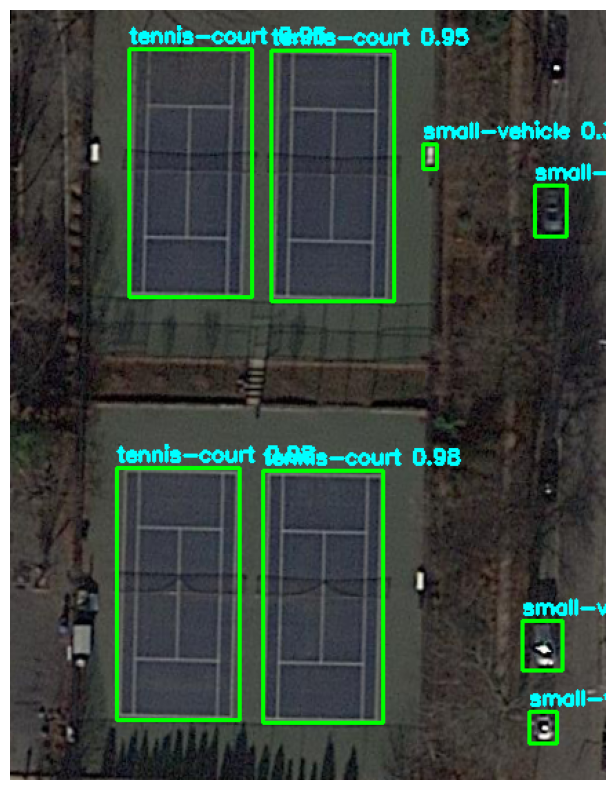

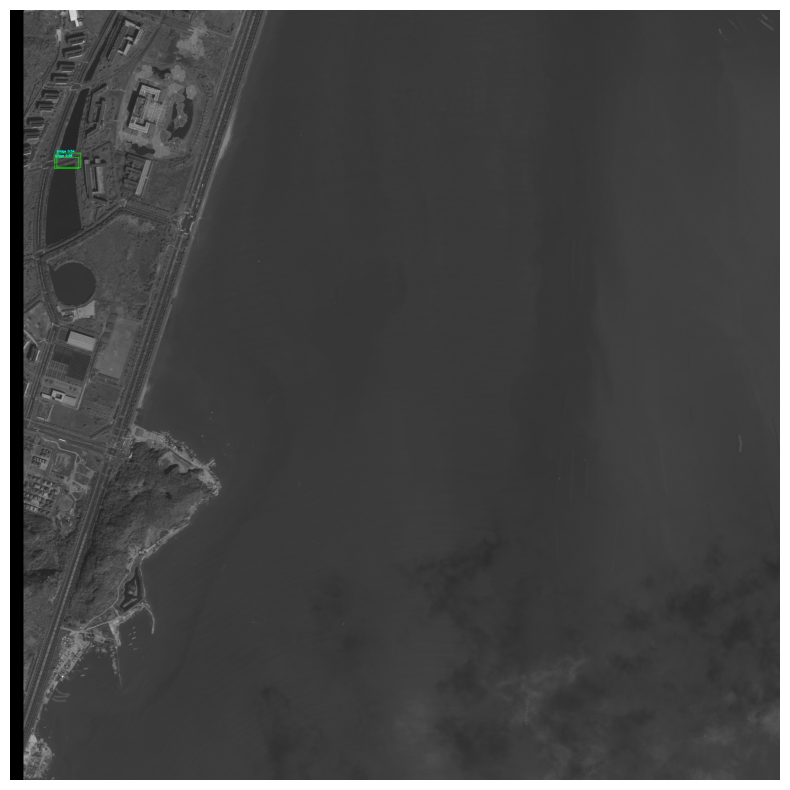

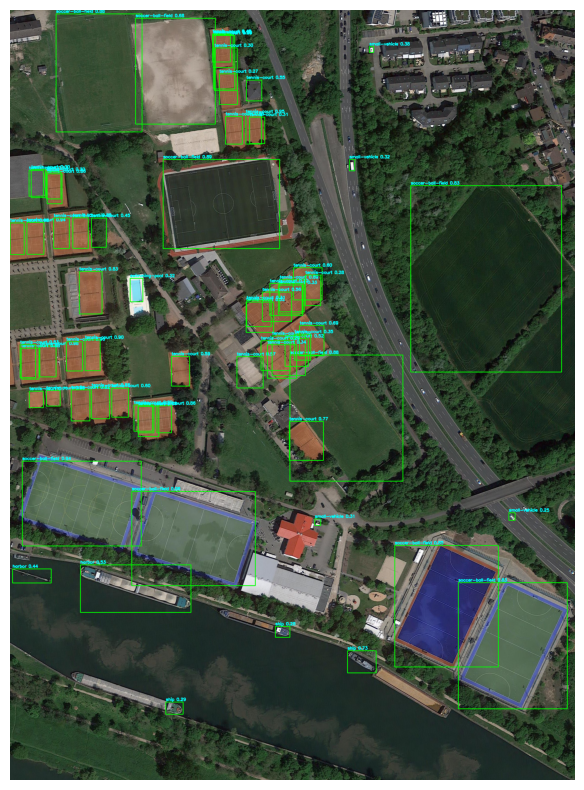

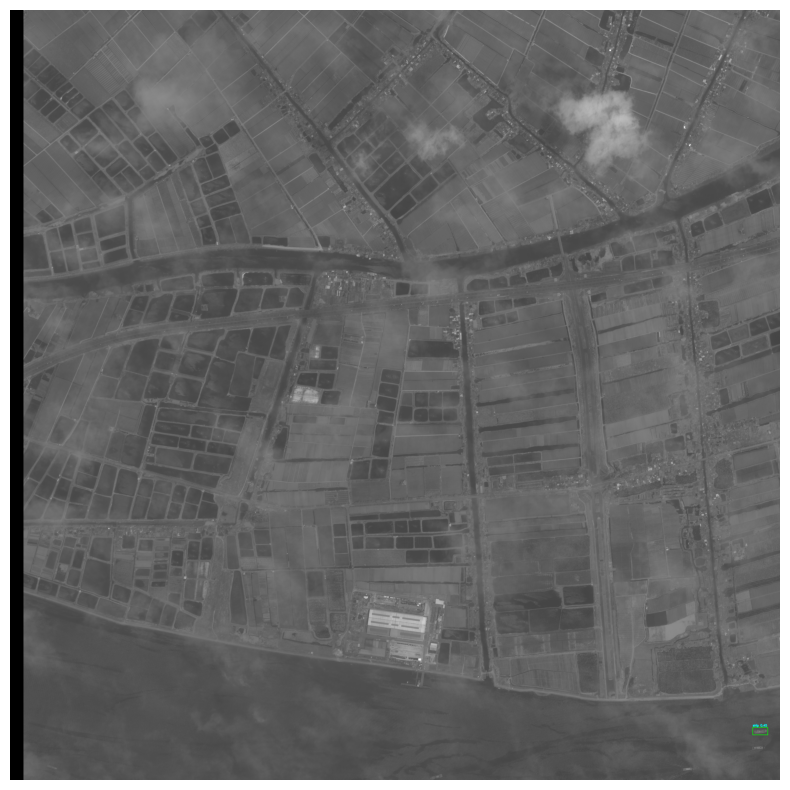

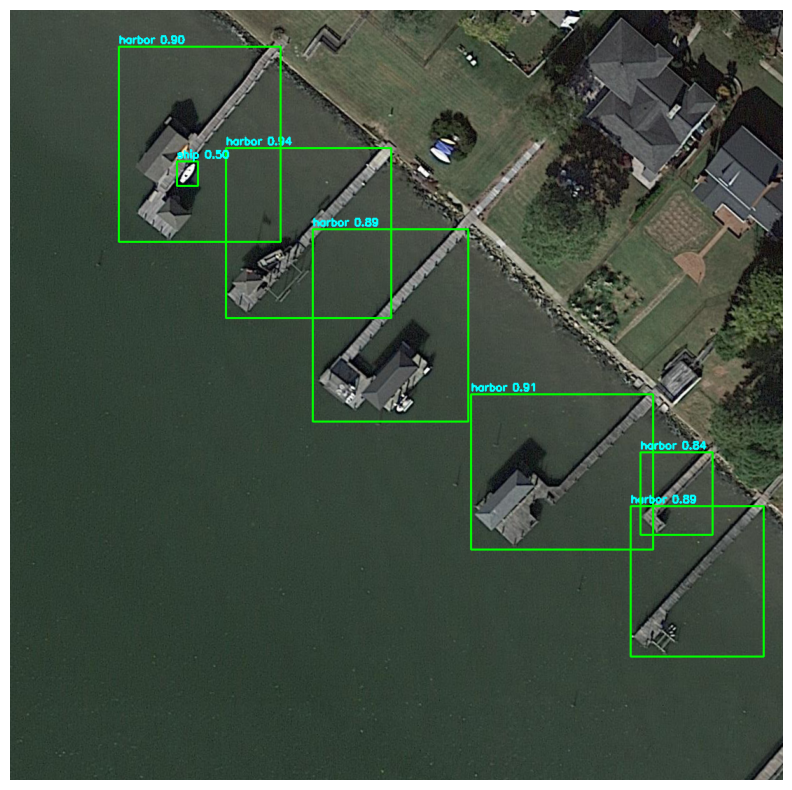

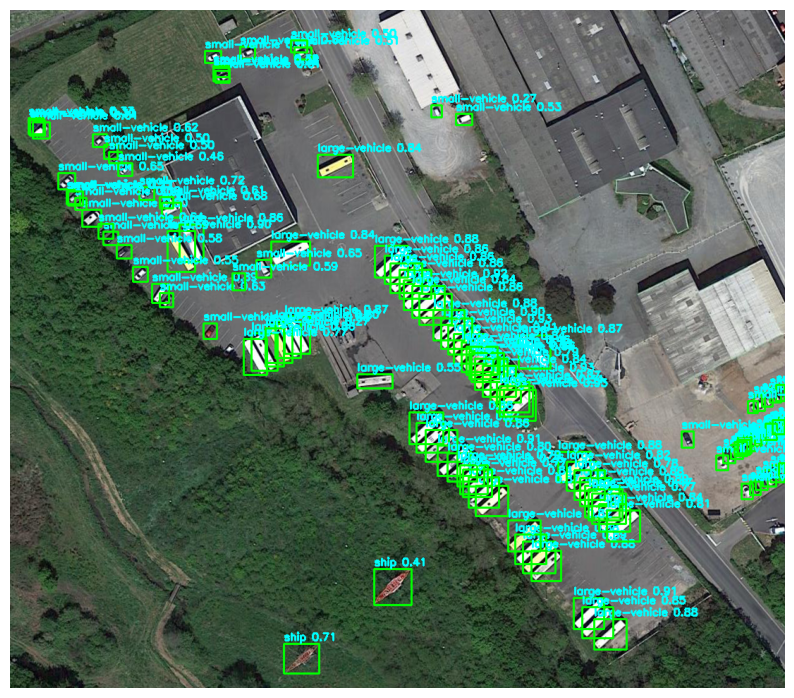

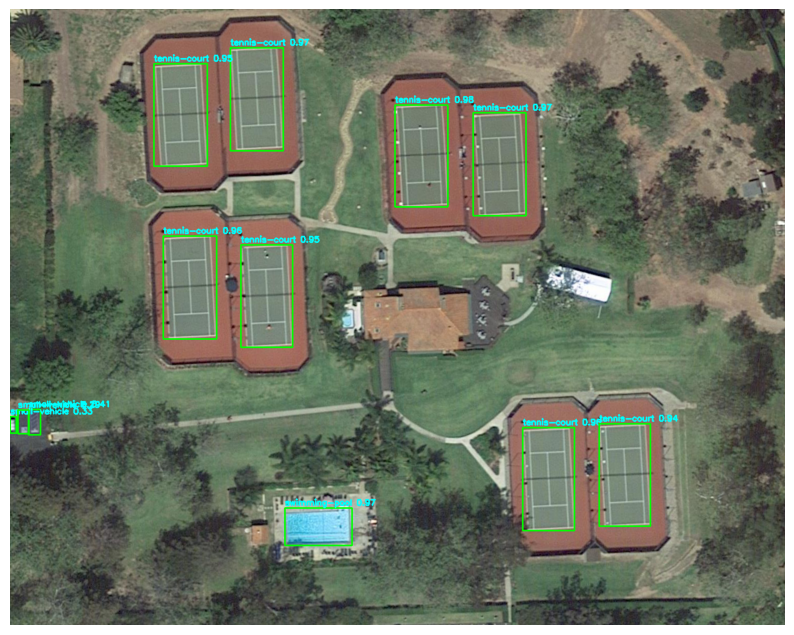

In [60]:
import matplotlib.pyplot as plt
import cv2

for r in results:
    img = r.orig_img.copy()
    for box in r.boxes:
        cls_id = int(box.cls[0])
        conf = float(box.conf[0])
        label = f"{model.names[cls_id]} {conf:.2f}"
        xyxy = box.xyxy[0].int().tolist()
        cv2.rectangle(img, tuple(xyxy[:2]), tuple(xyxy[2:]), (0, 255, 0), 2)
        cv2.putText(img, label, (xyxy[0], xyxy[1] - 5), cv2.FONT_HERSHEY_SIMPLEX, 0.5, (255,255,0), 2)
    
    img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    plt.figure(figsize=(10, 10))
    plt.imshow(img_rgb)
    plt.axis('off')
    plt.show()

In [61]:
metrics = model.val(data="yolo_dataset/data.yaml", split="val", imgsz=896)

Ultralytics 8.3.167 🚀 Python-3.11.13 torch-2.6.0+cu124 CUDA:0 (Tesla P100-PCIE-16GB, 16269MiB)
val: Fast image access ✅ (ping: 0.0±0.0 ms, read: 3639.5±465.8 MB/s, size: 9386.0 KB)


val: Scanning /kaggle/working/yolo_dataset/labels/val.cache... 283 images, 1 backgrounds, 0 corrupt: 100%|██████████| 283/283 [00:00<?, ?it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:21<00:00,  1.17s/it]
/usr/local/lib/python3.11/dist-packages/matplotlib/colors.py:721: RuntimeWarning: invalid value encountered in less
  xa[xa < 0] = -1
/usr/local/lib/python3.11/dist-packages/matplotlib/colors.py:721: RuntimeWarning: invalid value encountered in less
  xa[xa < 0] = -1


                   all        283      20793      0.738      0.424      0.458      0.279
                 plane         41       2385      0.862      0.618       0.68       0.37
      baseball-diamond         17         61       0.88      0.525      0.555      0.295
                bridge         43        307      0.552     0.0554      0.073      0.028
    ground-track-field         31         55      0.698      0.337      0.413      0.288
         small-vehicle         91       4076       0.63       0.43      0.428      0.222
         large-vehicle         75       3139      0.726      0.684      0.697      0.504
                  ship         69       6594      0.748      0.397       0.47      0.232
          tennis-court         62        516      0.911      0.868      0.906      0.785
      basketball-court         20        121      0.569      0.702      0.685      0.446
          storage-tank         30       1452      0.866      0.245      0.355      0.187
     soccer-ball-fiel

In [64]:
print("\n📊 Evaluation Results:")
print(f"mAP50:     {metrics.box.map50:.3f}")
print(f"mAP50-95:  {metrics.box.map:.3f}")
print(f"Precision: {metrics.box.mp:.3f}")
print(f"Recall:    {metrics.box.mr:.3f}")


📊 Evaluation Results:
mAP50:     0.458
mAP50-95:  0.279
Precision: 0.738
Recall:    0.424


In [65]:
os.makedirs("outputs/predictions", exist_ok=True)
model.predict(source=sample_images[:5], save=True, save_txt=False, project="outputs", name="predictions")
print("🖼️ Sample predictions saved to: outputs/predictions")


0: 896x896 17 ships, 103 storage-tanks, 9.7ms
1: 896x896 60 small-vehicles, 14 tennis-courts, 9.7ms
2: 896x896 15 ships, 3 harbors, 9.7ms
3: 896x896 4 small-vehicles, 4 tennis-courts, 9.7ms
4: 896x896 2 bridges, 9.7ms
Speed: 6.5ms preprocess, 9.7ms inference, 1.4ms postprocess per image at shape (1, 3, 896, 896)
Results saved to outputs/predictions2
🖼️ Sample predictions saved to: outputs/predictions


In [66]:
import os
import shutil
import random
from glob import glob

# Source directory
val_dir = "yolo_dataset/images/val"
download_dir = "inference_samples"

# Create destination folder
os.makedirs(download_dir, exist_ok=True)

# Pick 5 random images
val_images = glob(os.path.join(val_dir, "*.png"))
sample_images = random.sample(val_images, 5)

# Copy them to a local folder for download
for img_path in sample_images:
    shutil.copy(img_path, download_dir)

print(f"✅ Copied {len(sample_images)} images to {download_dir}/ for download.")

✅ Copied 5 images to inference_samples/ for download.


In [67]:
import shutil

# Create export folder
export_dir = "export_for_github"
os.makedirs(export_dir, exist_ok=True)

# Copy relevant folders and files
shutil.copytree("runs/train/yolov8_dota_run22", os.path.join(export_dir, "training_results"))
shutil.copy("yolo_dataset/data.yaml", export_dir)
shutil.copy("runs/train/yolov8_dota_run22/weights/best.pt", export_dir)
shutil.copytree("inference_samples", os.path.join(export_dir, "inference_samples"))

# Zip the folder
shutil.make_archive("yolo_export_package", 'zip', export_dir)

print("✅ Export complete! Download 'yolo_export_package.zip' from the file browser.")

✅ Export complete! Download 'yolo_export_package.zip' from the file browser.


In [68]:
import shutil

# Path to the folder you want to zip
export_dir = '/kaggle/working/export_for_github'

# Create a zip file of the folder
shutil.make_archive('yolo_export_package', 'zip', export_dir)

'/kaggle/working/yolo_export_package.zip'